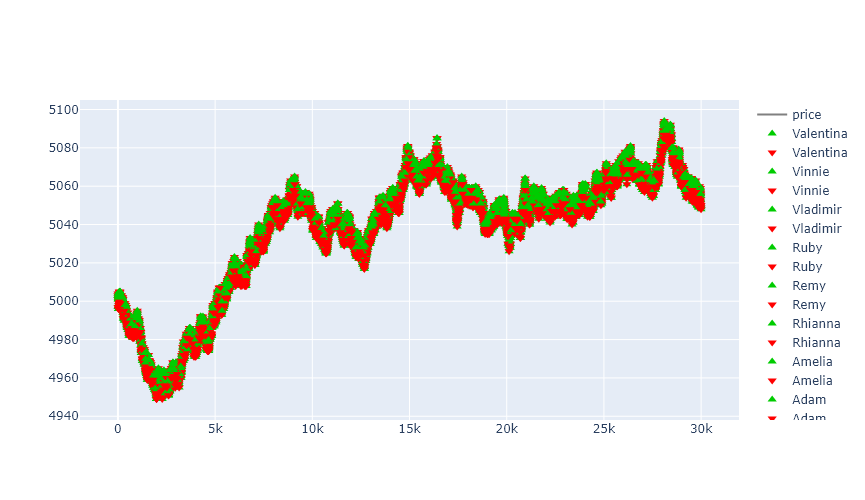

In [5]:
#STARFRUIT
import plotly.graph_objects as go
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('starfruit_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('starfruit_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'timestamp', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=500)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data.index, y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()

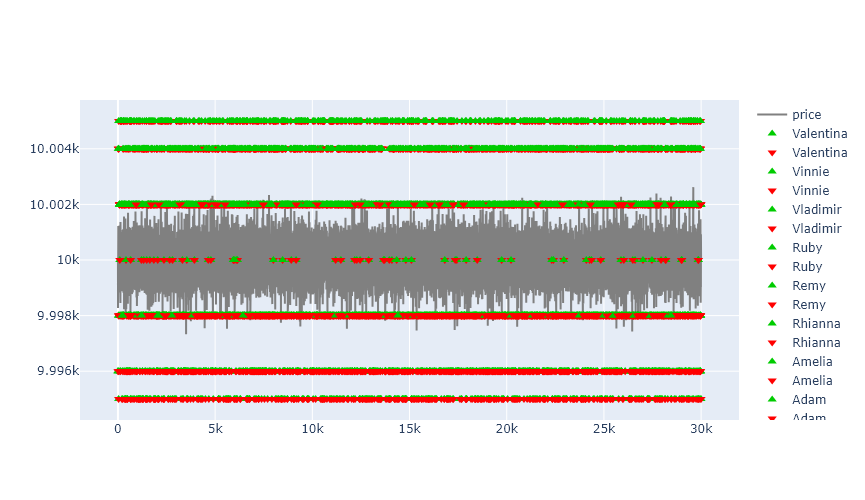

In [6]:
#AMETHYSTS
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('amethyst_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('amethyst_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'timestamp', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=500)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data.index, y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()

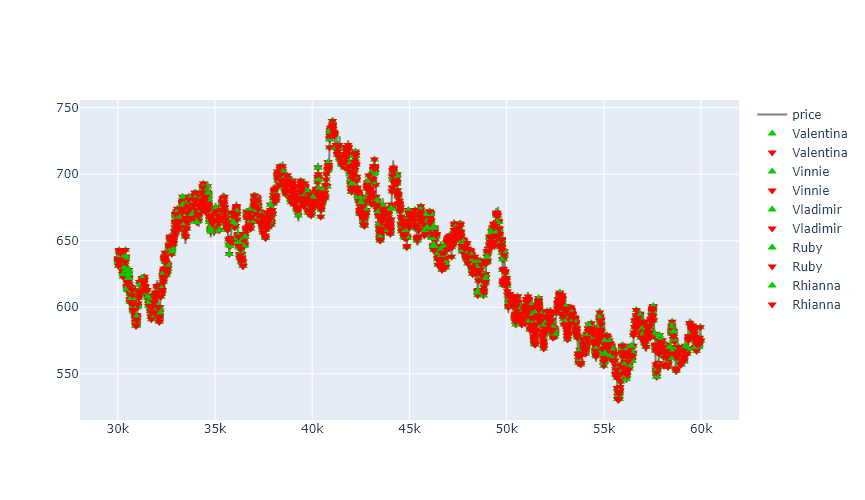

In [7]:
#COCONUT_COUPON
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('coupon_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('coupon_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=500)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data['timestamp'], y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()

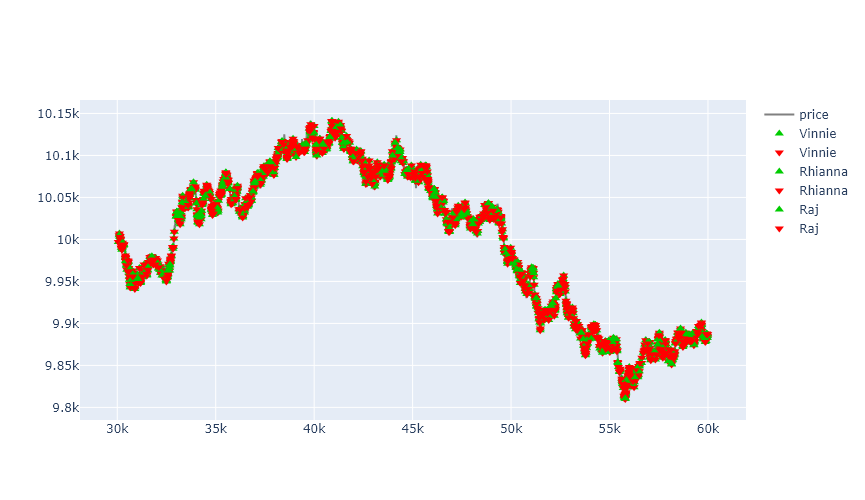

In [8]:
#COCONUT
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('coconut_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('coconut_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=500)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data['timestamp'], y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()

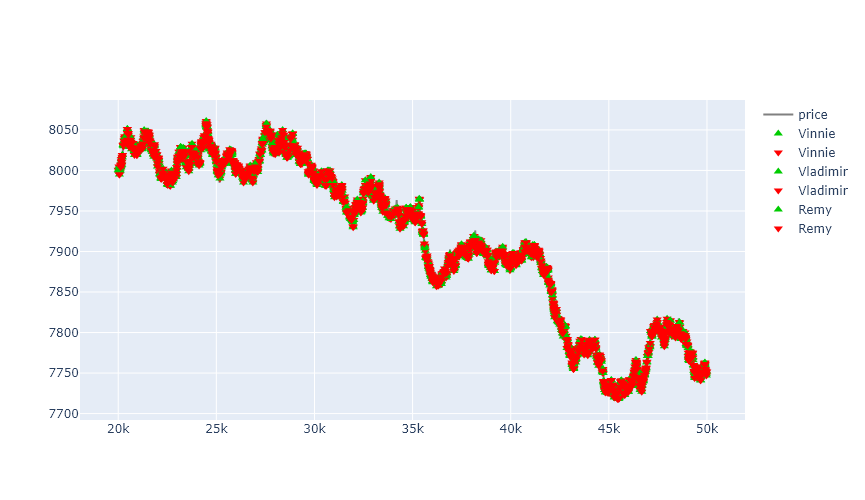

In [9]:
#CHOCOLATE
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('chocolate_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('chocolate_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=500)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data['timestamp'], y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()

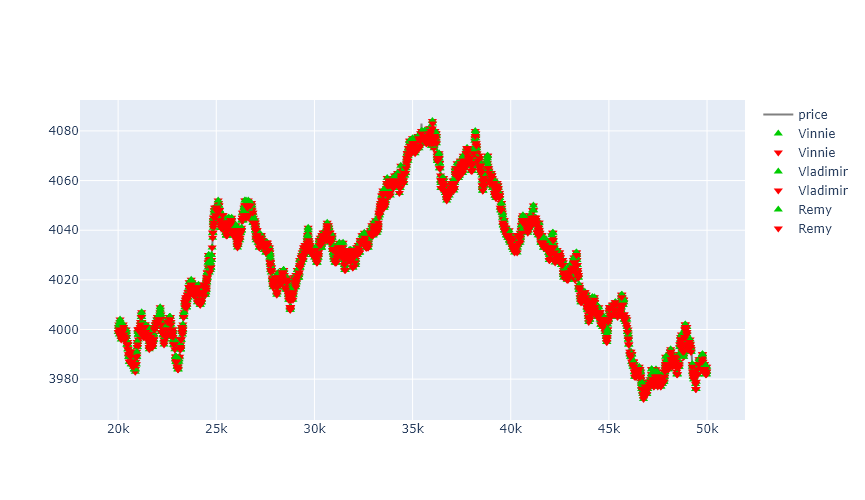

In [10]:
#STRAWBERRIES
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('strawberry_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('strawberry_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=500)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data['timestamp'], y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()

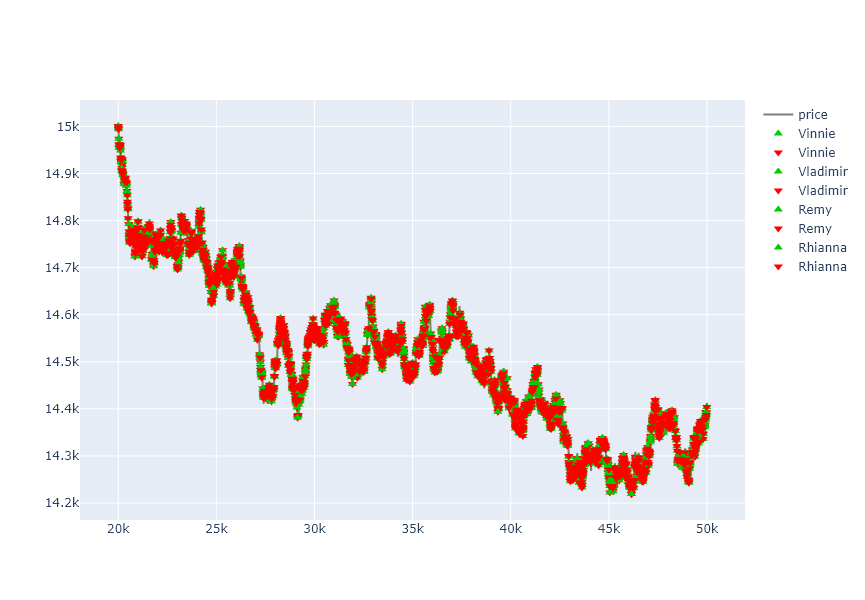

In [4]:
#ROSES 
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('roses_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('roses_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=600)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data['timestamp'], y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'], mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()

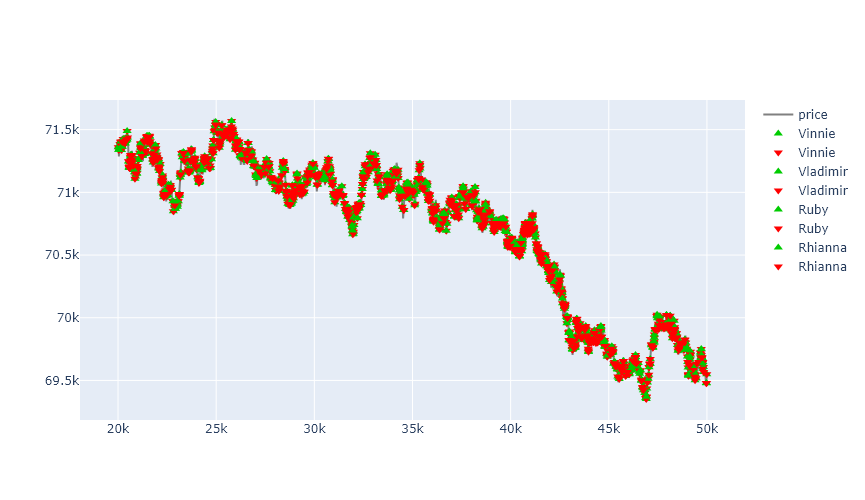

In [11]:
#BASKET
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

traders_observed = ['Valentina', 'Vinnie', 'Vladimir', 'Vivian', 'Celeste', 'Colin', 'Carlos', 'Camilla', 'Pablo', 'Penelope', 'Percy', 'Petunia', 'Ruby','Remy', 'Rhianna', 'Raj', 'Amelia', 'Adam', 'Alina', 'Amir']

price_data = pd.read_csv('basket_orderbook_data_all.csv', delimiter=';').fillna(0)
trade_data = pd.read_csv('basket_trade_data_all.csv', delimiter=';').fillna(0)
price_data['smart_price'] = (((price_data['bid_price_1']*price_data['bid_volume_1'] + price_data['bid_price_2']*price_data['bid_volume_2'] + price_data['bid_price_3']*price_data['bid_volume_3']) / (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) * (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']) + \
                            ((price_data['ask_price_1']*price_data['ask_volume_1'] + price_data['ask_price_2']*price_data['ask_volume_2'] + price_data['ask_price_3']*price_data['ask_volume_3']) / (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3'])) * (price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])) / \
                                (price_data['ask_volume_1']+price_data['ask_volume_2']+price_data['ask_volume_3']+price_data['bid_volume_1']+price_data['bid_volume_2']+price_data['bid_volume_3'])
price_data = price_data.drop(['bid_price_1', 'bid_volume_1', 'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3', 'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2', 'ask_price_3', 'ask_volume_3', 'profit_and_loss', 'day', 'mid_price'], axis=1)
traders = pd.DataFrame(columns=['timestamp', 'name', 'buys', 'sells', 'price'])
for idx, row in trade_data.iterrows():  
    data = pd.DataFrame(data={'timestamp': [row['timestamp'], row['timestamp']], 'name' : [row['buyer'], row['seller']], 'buys' : [row['quantity'], 0], 'sells' : [0, -row['quantity']], 'price': [row['price'], row['price']]}, columns=['timestamp', 'name', 'buys', 'sells', 'price'])
    traders = pd.concat([traders, data], axis=0)
traders = traders.groupby(['timestamp', 'name', 'price'], as_index=False).agg({'buys': 'sum', 'sells': 'sum'})
layout = go.Layout(autosize=False, width=800, height=500)
fig = go.Figure(layout=layout)
fig.add_trace(go.Scatter(x=price_data['timestamp'], y=price_data['smart_price'], mode='lines', name='price', line=dict(color = 'rgb(128, 128, 128)')))
for snake in traders_observed:
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['buys'] != 0)]['price'],
                        mode='markers', name=snake, marker=dict(color = 'rgb(0, 204, 0)', size = 8, symbol = 'triangle-up')))
    fig.add_trace(go.Scatter(x=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['timestamp'], y=traders.loc[(traders['name'] == snake) & (traders['sells'] != 0)]['price'],
                        mode='markers', name=snake, marker=dict(color = 'rgb(255, 0, 0)', size = 8, symbol = 'triangle-down')))
fig.show()